### 2.4. Problem Statement: Machine Learning 4

Predicting Survival in the Titanic Data Set
We will be using a decision tree to make predictions about the Titanic data
set from Kaggle. This data set provides information on the Titanic
passengers and can be used to predict whether a passenger survived or
not.

In [3]:
import numpy as np # linear algebra and arraus
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix

In [4]:
titanic = pd.read_csv("https://raw.githubusercontent.com/BigDataGal/Python-for-Data-Science/master/titanic-train.csv")
titanic.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [30]:
titanic.describe()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare,family_size
count,891.000000,891.000000,891.000000,891.000000,891.000000,891.000000,891.000000,891.000000
mean,446.000000,0.383838,2.308642,29.361582,0.523008,0.381594,32.204208,1.904602
std,257.353842,0.486592,0.836071,13.019697,1.102743,0.806057,49.693429,1.613459
min,1.000000,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000,1.000000
25%,223.500000,0.000000,2.000000,22.000000,0.000000,0.000000,7.910400,1.000000
50%,446.000000,0.000000,3.000000,28.000000,0.000000,0.000000,14.454200,1.000000
75%,668.500000,1.000000,3.000000,35.000000,1.000000,0.000000,31.000000,2.000000
max,891.000000,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200,11.000000


In [5]:
# Count missing values in train – missing 177 Age and 2 Embarked values in train (ignoring missing cabin)
titanic.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

In [6]:
# Cleaning and Formatting the train Data 
# Filling missing Age values with median
titanic["Age"] = titanic["Age"].fillna(titanic["Age"].median())

# Impute the Embarked variable
titanic["Embarked"] = titanic["Embarked"].fillna("S")


In [7]:
# Convert the male and female groups and Embarked classes to dummy variables using OneHotEncoding method
# but first we have to drop columns that aren't helpful and our target variable
# and differentiate between categorical and numeric columns
candidate_train_predictors = titanic.drop(['PassengerId','Survived','Name','Ticket','Cabin'], axis=1)
categorical_cols = [cname for cname in candidate_train_predictors.columns if 
                                candidate_train_predictors[cname].nunique() < 10 and
                                candidate_train_predictors[cname].dtype == "object"]
numeric_cols = [cname for cname in candidate_train_predictors.columns if 
                                candidate_train_predictors[cname].dtype in ['int64', 'float64']]
my_cols = categorical_cols + numeric_cols
train_predictors = candidate_train_predictors[my_cols]

dummy_encoded_train_predictors = pd.get_dummies(train_predictors)

In [8]:
# Create the target and features numpy arrays: target, features_one
y_target = titanic["Survived"].values
x_features_one = dummy_encoded_train_predictors.values
print(x_features_one)

[[ 3. 22.  1. ...  0.  0.  1.]
 [ 1. 38.  1. ...  1.  0.  0.]
 [ 3. 26.  0. ...  0.  0.  1.]
 ...
 [ 3. 28.  1. ...  0.  0.  1.]
 [ 1. 26.  0. ...  1.  0.  0.]
 [ 3. 32.  0. ...  0.  1.  0.]]


In [9]:
## Split the data into training and validation sets - 80%/20%
x_train, x_validation, y_train, y_validation = train_test_split(x_features_one,y_target,test_size=.20,random_state=1)

In [10]:
# Fit first decision tree: tree_one
tree_one = tree.DecisionTreeClassifier()
tree_one = tree_one.fit(x_features_one, y_target)

In [11]:
# Look at the score of the included features
tree_one_accuracy = round(tree_one.score(x_features_one, y_target), 4)
print("Accuracy: %0.4f" % (tree_one_accuracy))

Accuracy: 0.9798


In [12]:
# Predict y_target given validation set
predictions = tree_one.predict(x_validation)

## Look at the confusion matrix ([TN,FN],[FP,TP])
confusion_matrix(y_validation,predictions)

array([[106,   0],
       [  7,  66]], dtype=int64)

In [13]:
## score of predicted output from tree_one model against ground truth
accuracy_score(y_validation, predictions)

0.9608938547486033

In [15]:
# Overfitting and additional features
# Create the target and features numpy arrays: target, features_two
y_target = titanic["Survived"].values
x_features_two = dummy_encoded_train_predictors.values

In [16]:
# Fit second decision tree: tree_two
tree_two = tree.DecisionTreeClassifier()
tree_two = tree_two.fit(x_features_two, y_target)

# Look at the score of the included features - SAME AS BEFORE
tree_two_accuracy = round(tree_two.score(x_features_two, y_target), 4)
print("Accuracy: %0.4f" % (tree_two_accuracy))

Accuracy: 0.9798


In [17]:
#Control overfitting by setting "max_depth" to 10 and "min_samples_split" to 5
max_depth = 10
min_samples_split = 5
tree_two = tree.DecisionTreeClassifier(max_depth = max_depth, min_samples_split = min_samples_split, random_state = 1)
tree_two = tree_two.fit(x_features_two, y_target)

# Look at the score of the included features
tree_two_accuracy = round(tree_two.score(x_features_two, y_target), 4)
print("Accuracy: %0.4f" % (tree_two_accuracy))

Accuracy: 0.9091


E:\Anaconda3\lib\site-packages\dtreeplt\dtreeplt.py:185: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if not tree_info_dict['features'][i] == 'target':


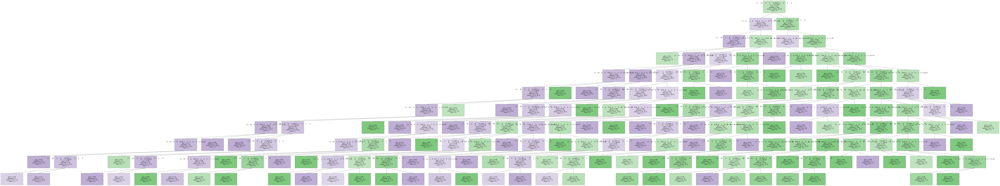

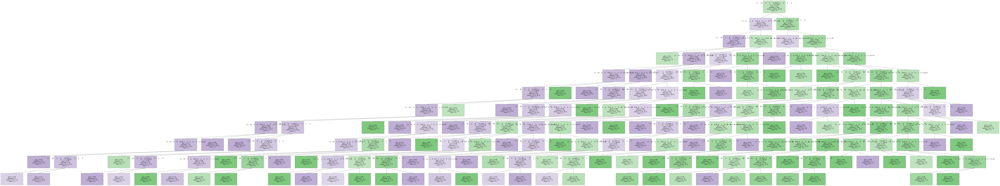

In [21]:
from dtreeplt import dtreeplt
dtree=dtreeplt( model=tree_two,feature_names=x_features_twob,target_names=['0','1'])
dtree.view()

In [24]:
# Feature Engineering
# add column to original pandas dataframe and then re-do one hot encoding
titanic['family_size'] = 1 + titanic['SibSp'] + titanic['Parch']

candidate_train_predictors = titanic.drop(['PassengerId','Survived','Name','Ticket','Cabin','SibSp','Parch'], axis=1)
categorical_cols = [cname for cname in candidate_train_predictors.columns if 
                                candidate_train_predictors[cname].nunique() < 10 and
                                candidate_train_predictors[cname].dtype == "object"]
numeric_cols = [cname for cname in candidate_train_predictors.columns if 
                                candidate_train_predictors[cname].dtype in ['int64', 'float64']]
my_cols = categorical_cols + numeric_cols
train_predictors = candidate_train_predictors[my_cols]

dummy_encoded_train_predictors = pd.get_dummies(train_predictors)

# Create the target and features numpy arrays: target, features_three
y_target = titanic["Survived"].values
x_features_three = dummy_encoded_train_predictors.values

In [25]:
# Fit third decision tree: tree_three
tree_three = tree.DecisionTreeClassifier()
tree_three = tree_three.fit(x_features_three, y_target)

In [26]:
# Look at the score of the included features
tree_three_accuracy = round(tree_three.score(x_features_three, y_target), 4)
print("Accuracy: %0.4f" % (tree_three_accuracy))

Accuracy: 0.9798


In [27]:
#Control overfitting by setting "max_depth" to 10 and "min_samples_split" to 5
max_depth = 10
min_samples_split = 5
tree_three = tree.DecisionTreeClassifier(max_depth = max_depth, min_samples_split = min_samples_split, random_state = 1)
tree_three = tree_three.fit(x_features_three, y_target)

In [28]:
# Look at overfit controlled tree with Engineered Feature 'family_size'
# Look at the score of the included features
print(tree_three.score(x_features_three, y_target))

0.9090909090909091


E:\Anaconda3\lib\site-packages\dtreeplt\dtreeplt.py:185: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if not tree_info_dict['features'][i] == 'target':


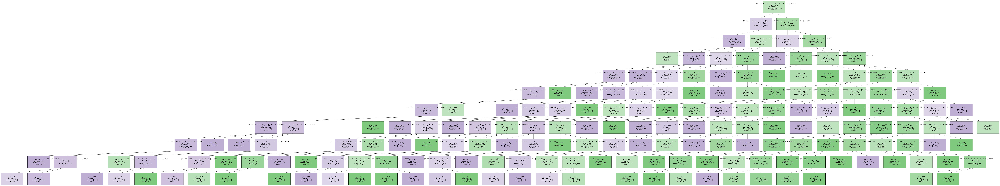

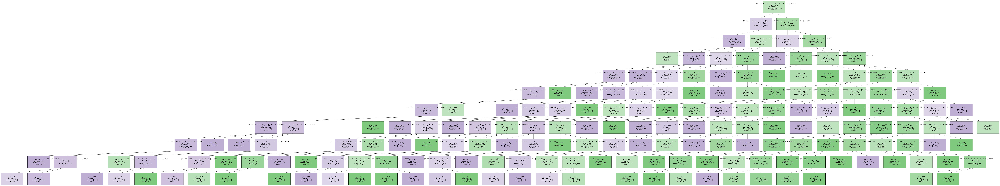

In [29]:
from dtreeplt import dtreeplt
dtree=dtreeplt( model=tree_two,feature_names=x_features_three,target_names=['0','1'])
dtree.view()

#------------------------------------------#